In [74]:
#Imports
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.filters import gaussian, prewitt
from skimage.morphology import erosion, disk
from skimage.color import rgb2gray

In [75]:
#Helper function
def show_images(images, titles, rows, cols, cmap=None, figsize=(14, 8)):
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(rows, cols, i)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

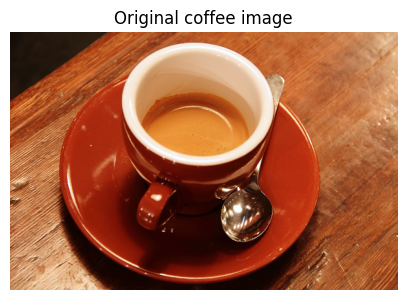

In [76]:
#Load coffee image
coffee = img_as_float(data.coffee())

plt.figure(figsize=(5, 5))
plt.imshow(coffee)
plt.title("Original coffee image")
plt.axis("off")
plt.show()

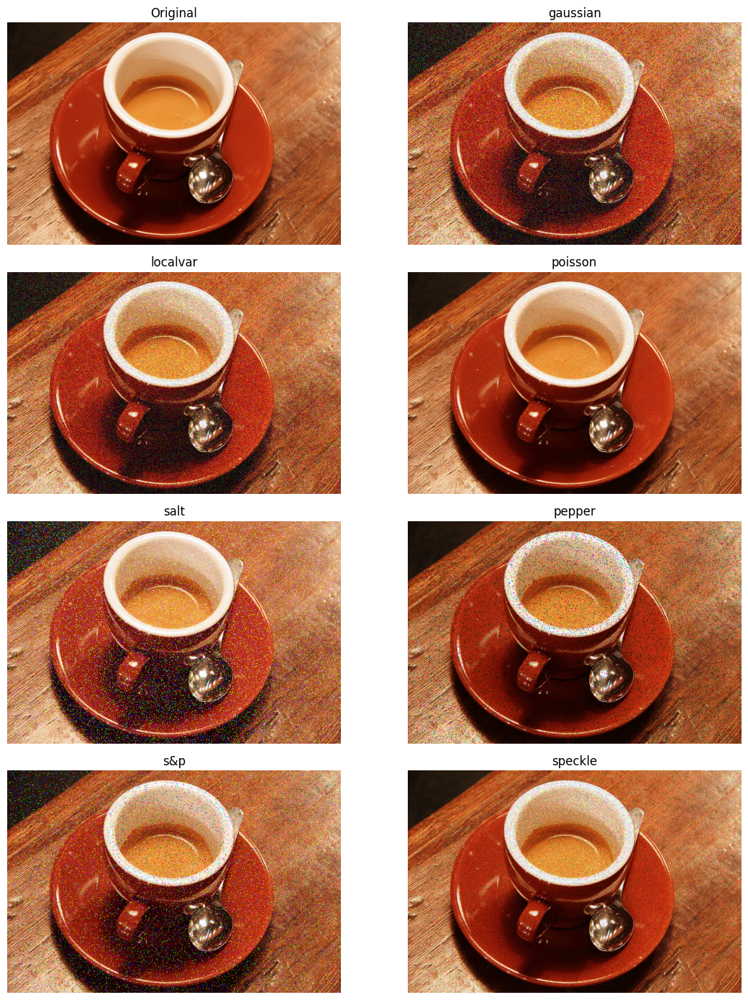

In [77]:
#Add 7 types of noise

noise_modes = ["gaussian", "localvar", "poisson", "salt", "pepper", "s&p", "speckle"]

noisy_images = []

for mode in noise_modes:
    if mode == "localvar":
        local_variance = np.ones(coffee.shape) * 0.02
        noisy = random_noise(coffee, mode=mode, local_vars=local_variance, rng=10)

    elif mode in ["gaussian", "speckle"]:
        noisy = random_noise(coffee, mode=mode, var=0.03, rng=10)

    elif mode in ["salt", "pepper", "s&p"]:
        noisy = random_noise(coffee, mode=mode, amount=0.08, rng=10)

    else:
        noisy = random_noise(coffee, mode=mode, rng=10)

    noisy_images.append(noisy)

images_task2 = [coffee] + noisy_images
titles_task2 = ["Original"] + noise_modes

show_images(images_task2, titles_task2, 4, 2, figsize=(12, 14))

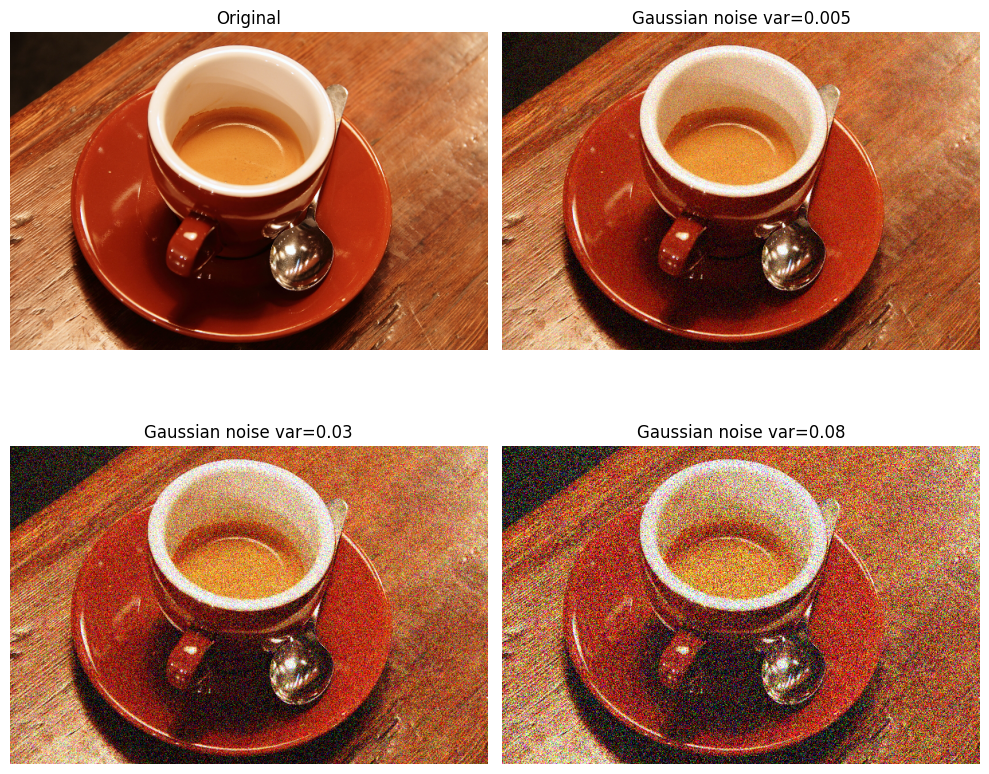

In [78]:
# Select one noise type with 3 intensity levels
# I choose Gaussian noise

variances = [0.005, 0.03, 0.08]
gaussian_noisy = [
    random_noise(coffee, mode="gaussian", var=v, rng=20)
    for v in variances
]

titles_task3 = [
    "Original",
    "Gaussian noise var=0.005",
    "Gaussian noise var=0.03",
    "Gaussian noise var=0.08"
]

show_images([coffee] + gaussian_noisy, titles_task3, 2, 2, figsize=(10, 9))

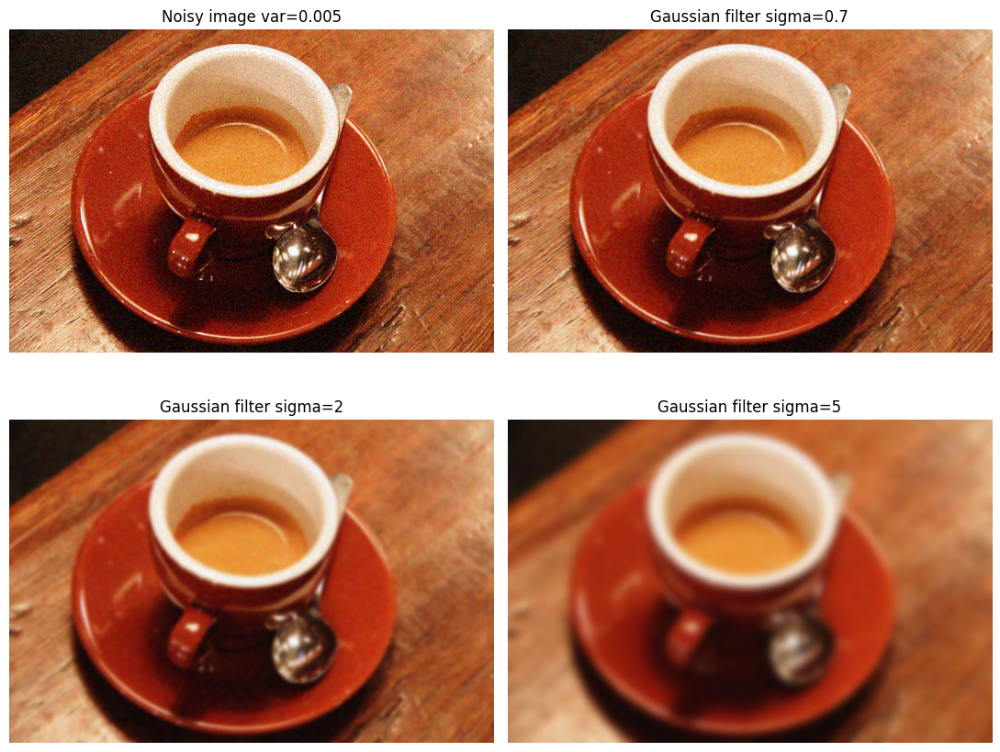

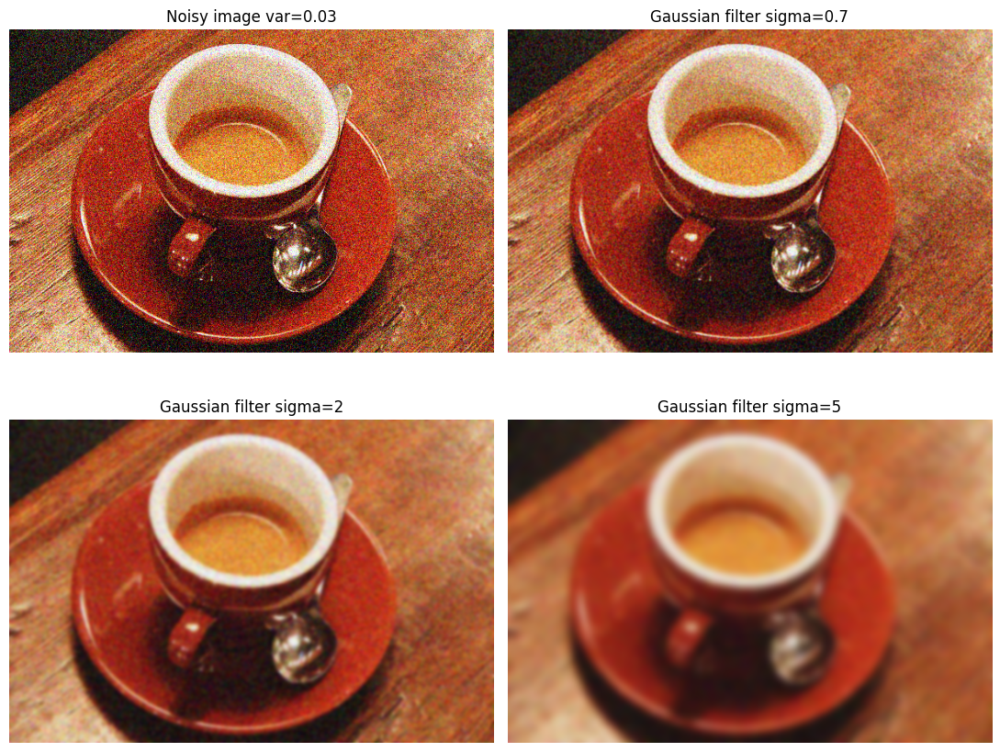

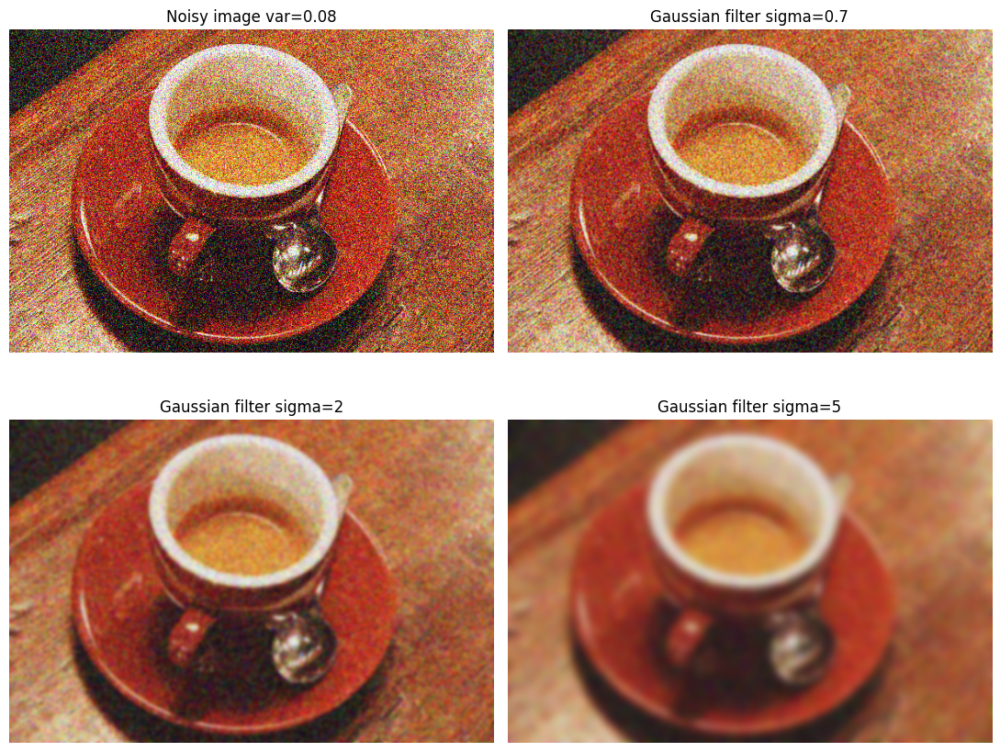

In [79]:
#Gaussian filter with different sigma values

sigma_values = [0.7, 2, 5]

for noisy_img, var in zip(gaussian_noisy, variances):
    filtered_versions = [
        gaussian(noisy_img, sigma=s, channel_axis=-1)
        for s in sigma_values
    ]

    images = [noisy_img] + filtered_versions
    titles = [
        f"Noisy image var={var}",
        "Gaussian filter sigma=0.7",
        "Gaussian filter sigma=2",
        "Gaussian filter sigma=5"
    ]

    show_images(images, titles, 2, 2, figsize=(11, 9))

In [80]:

print("""
When sigma is small, the Gaussian filter removes only a small part of the noise.
When sigma increases, the image becomes smoother, but fine details and edges become blurred.
For strong noise, a larger sigma gives better denoising, but it also destroys more image details.
""")


When sigma is small, the Gaussian filter removes only a small part of the noise.
When sigma increases, the image becomes smoother, but fine details and edges become blurred.
For strong noise, a larger sigma gives better denoising, but it also destroys more image details.



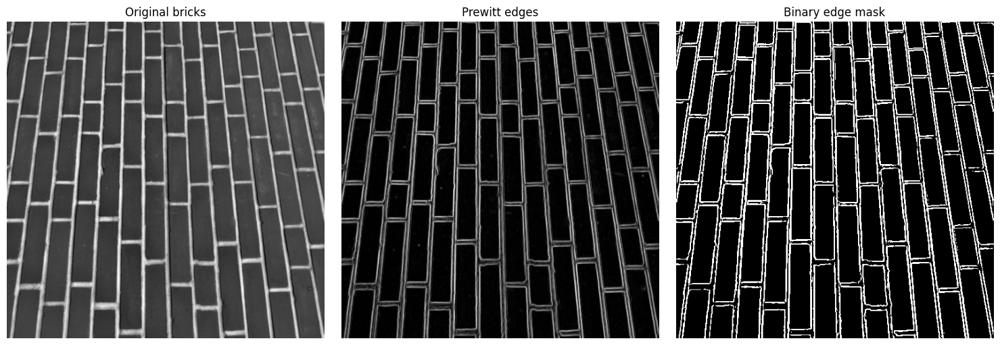

Fraction corresponding to edges: 0.1711
Fraction corresponding to bricks: 0.8289


In [81]:
#Prewitt edge detection on bricks image

bricks = img_as_float(data.brick())
edges = prewitt(bricks)

# Threshold edges
threshold = np.mean(edges) + np.std(edges)
edge_mask = edges > threshold
brick_mask = ~edge_mask

edge_fraction = np.sum(edge_mask) / edge_mask.size
brick_fraction = np.sum(brick_mask) / brick_mask.size

show_images(
    [bricks, edges, edge_mask],
    ["Original bricks", "Prewitt edges", "Binary edge mask"],
    1, 3,
    cmap="gray",
    figsize=(15, 5)
)

print(f"Fraction corresponding to edges: {edge_fraction:.4f}")
print(f"Fraction corresponding to bricks: {brick_fraction:.4f}")

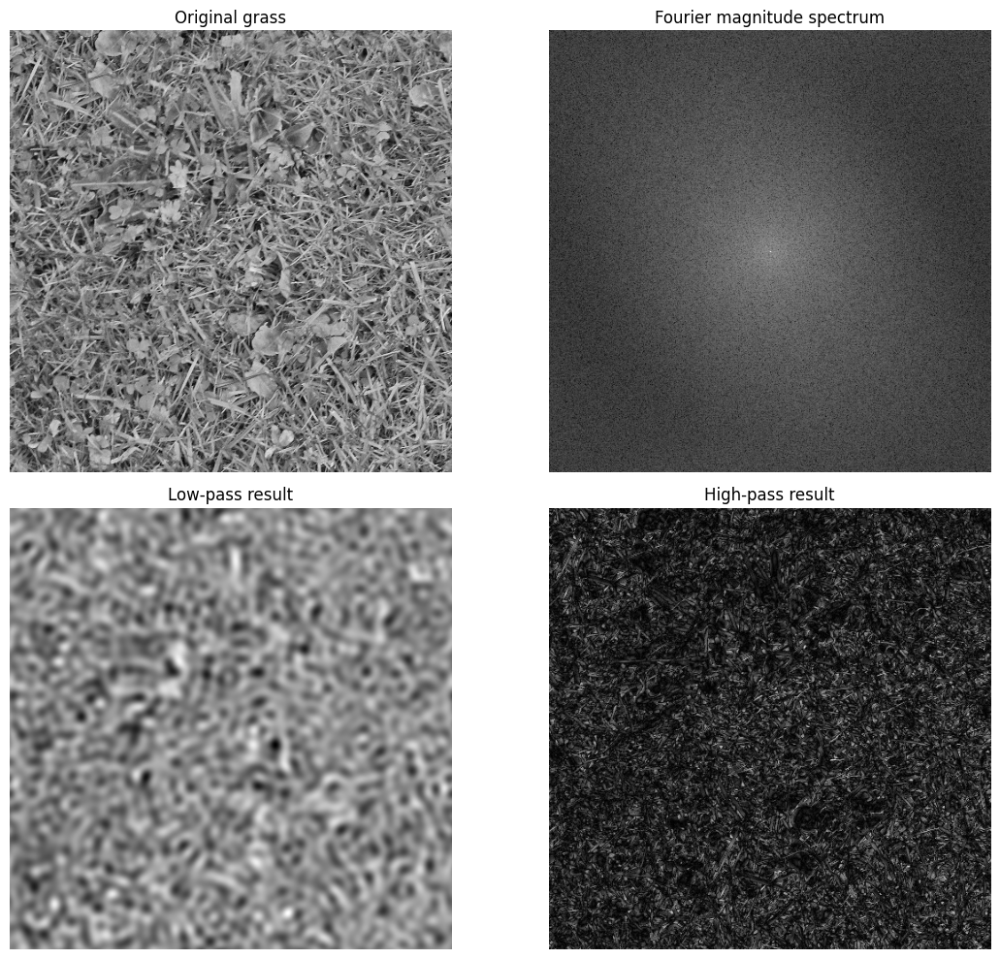

In [82]:
#High-pass and low-pass filters in frequency domain on grass image

grass = img_as_float(data.grass())

F = np.fft.fft2(grass)
F_shift = np.fft.fftshift(F)

rows, cols = grass.shape
crow, ccol = rows // 2, cols // 2

radius = 35

y, x = np.ogrid[:rows, :cols]
distance_from_center = np.sqrt((y - crow)**2 + (x - ccol)**2)

low_pass_mask = distance_from_center <= radius
high_pass_mask = distance_from_center > radius

F_low = F_shift * low_pass_mask
F_high = F_shift * high_pass_mask

low_img = np.abs(np.fft.ifft2(np.fft.ifftshift(F_low)))
high_img = np.abs(np.fft.ifft2(np.fft.ifftshift(F_high)))

spectrum = np.log1p(np.abs(F_shift))

show_images(
    [grass, spectrum, low_img, high_img],
    ["Original grass", "Fourier magnitude spectrum", "Low-pass result", "High-pass result"],
    2, 2,
    cmap="gray",
    figsize=(12, 10)
)

In [83]:

print("""
Low-pass filtering keeps the low frequencies near the center of the Fourier transform.
The result is a smoother image with large-scale structures.

High-pass filtering removes the low frequencies and keeps rapid spatial changes.
The result emphasizes fine texture, borders, and small grass patterns.
""")


Low-pass filtering keeps the low frequencies near the center of the Fourier transform.
The result is a smoother image with large-scale structures.

High-pass filtering removes the low frequencies and keeps rapid spatial changes.
The result emphasizes fine texture, borders, and small grass patterns.



Number of erosions needed to remove all blobs: 7


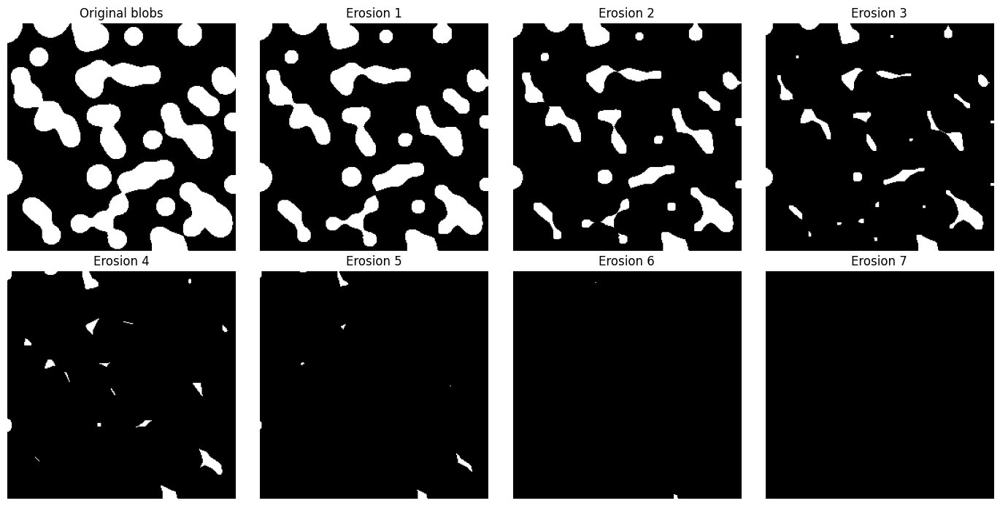

In [84]:
#binary blobs + repeated erosions

blobs = data.binary_blobs(
    length=256,
    blob_size_fraction=0.12,
    volume_fraction=0.35,
    rng=5
)

footprint = disk(3)

current = blobs.copy()
erosion_count = 0
erosion_steps = [current.copy()]

while np.any(current):
    current = erosion(current, footprint)
    erosion_count += 1

    if erosion_count <= 6 or not np.any(current):
        erosion_steps.append(current.copy())

print(f"Number of erosions needed to remove all blobs: {erosion_count}")

titles = ["Original blobs"] + [f"Erosion {i}" for i in range(1, len(erosion_steps))]
show_images(erosion_steps, titles, 2, 4, cmap="gray", figsize=(14, 7))